## Part 5 — Multi‑Plane Tracking + Portal Visualization

This notebook is a **clean, reader-friendly** walkthrough of **Part 5**.

Aligned with the real project code:
- Main implementation: `multiplane.py` (multi-plane tracking + portal rendering)
- Camera parameters helper: `config.py` → `get_camera_params_from_config`
- Parameters: `config.py` → `Part5Config`

### Goal
Track **three different planar targets** simultaneously and draw a portal on each detected plane.

We will:
- load the 3 reference images
- compute camera intrinsics/distortion from the saved calibration
- run the same feature pipeline (SIFT/ORB) as `multiplane.py`
- visualize the result on a single frame (quick)

Optional: export a full video using `export_part5_video()`.

---

### Setup
Run from inside the `augmented-reality-planar/` folder so relative `data/...` paths resolve.


In [36]:
from pathlib import Path

import cv2
import numpy as np
import matplotlib.pyplot as plt

from config import Part5Config, get_camera_params_from_config
from multiplane import (
    PlaneTracker,
    _draw_plane_outline_corners_stripes,
    _alpha_fill_convex_poly,
    _camera_center_in_object,
    _render_portal_from_equirect_sphere,
    _warp_texture_onto_quad,
    _warp_texture_onto_quad_with_frame_mask,
    _get_homography_method,
)

ROOT = Path().resolve()
cfg5 = Part5Config()

print("video:", cfg5.video_path)
print("refs:", cfg5.reference1_path, cfg5.reference2_path, cfg5.reference3_path)
print("feature:", cfg5.feature_type)
print("mode params: portal_shape=", cfg5.portal_shape, " portal_size_frac=", cfg5.portal_size_frac)


video: data/multi_plane_video.mp4
refs: data/reference1.JPG data/reference2.JPG data/reference3.JPG
feature: SIFT
mode params: portal_shape= ellipse  portal_size_frac= 0.5


### Step 1 — Load references and one video frame

We’ll evaluate tracking on **one frame** first (fast).


(1920, 1080, (5, 1))

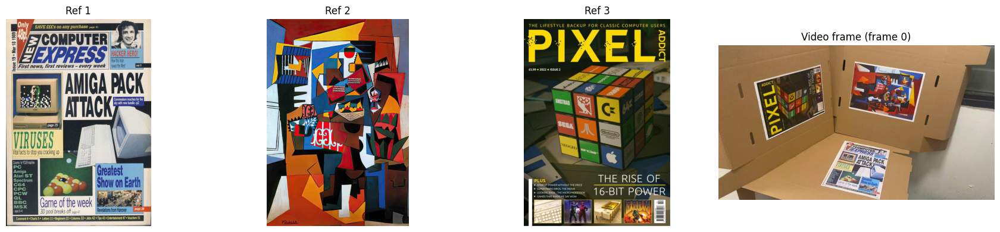

In [37]:
def imread_any(p: Path):
    img = cv2.imread(str(p))
    if img is not None:
        return img
    data = np.fromfile(str(p), dtype=np.uint8)
    if data.size == 0:
        return None
    return cv2.imdecode(data, cv2.IMREAD_COLOR)

ref_paths = [ROOT / cfg5.reference1_path, ROOT / cfg5.reference2_path, ROOT / cfg5.reference3_path]
refs = []
for p in ref_paths:
    img = imread_any(p)
    assert img is not None, f"Could not read reference: {p}"
    refs.append(img)

# Choose which frame to analyze
frame_idx = 0  # change this (e.g., 120, 250, ...)

cap = cv2.VideoCapture(str(ROOT / cfg5.video_path))
assert cap.isOpened(), f"Could not open video: {cfg5.video_path}"

out_w = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
out_h = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

cap.set(cv2.CAP_PROP_POS_FRAMES, int(frame_idx))
ok, frame_bgr = cap.read()
cap.release()
assert ok and frame_bgr is not None, f"Could not read frame {frame_idx}"

K, dist = get_camera_params_from_config((out_w, out_h), calib_output_path=cfg5.calib_output_path)

fig, ax = plt.subplots(1, 4, figsize=(18, 4))
ax[0].imshow(cv2.cvtColor(refs[0], cv2.COLOR_BGR2RGB)); ax[0].set_title("Ref 1")
ax[1].imshow(cv2.cvtColor(refs[1], cv2.COLOR_BGR2RGB)); ax[1].set_title("Ref 2")
ax[2].imshow(cv2.cvtColor(refs[2], cv2.COLOR_BGR2RGB)); ax[2].set_title("Ref 3")
ax[3].imshow(cv2.cvtColor(frame_bgr, cv2.COLOR_BGR2RGB)); ax[3].set_title(f"Video frame (frame {frame_idx})")
for a in ax:
    a.axis("off")
plt.tight_layout()

(out_w, out_h, dist.shape)


### Step 2 — Detect frame features (SIFT/ORB)

We compute keypoints + descriptors on the video frame once.

Then, in the next steps:
- we match each reference image to this frame
- only after that we estimate the plane (homography/pose) and draw portals


frame keypoints: 5083
frame descriptors: (5083, 128)


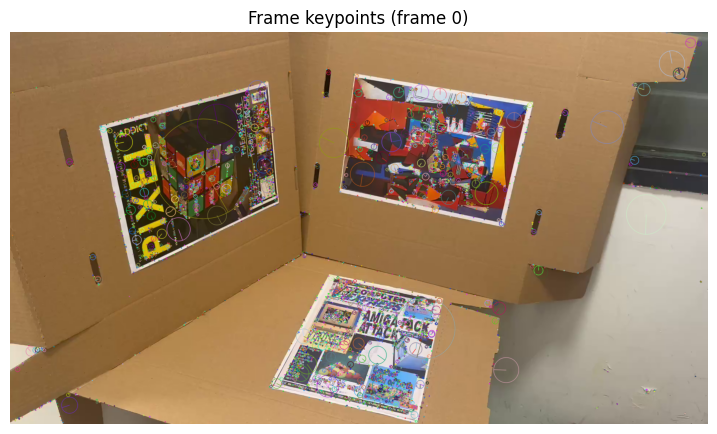

In [38]:
feat = str(cfg5.feature_type or "SIFT").strip().upper()
if feat == "SIFT":
    assert hasattr(cv2, "SIFT_create"), "SIFT is not available in this OpenCV build"
    frame_detector = cv2.SIFT_create()
elif feat == "ORB":
    frame_detector = cv2.ORB_create(nfeatures=2000)
else:
    raise ValueError(f"Unknown feature_type: {cfg5.feature_type}")

frame_gray = cv2.cvtColor(frame_bgr, cv2.COLOR_BGR2GRAY)
kp_fr, des_fr = frame_detector.detectAndCompute(frame_gray, None)

print("frame keypoints:", 0 if kp_fr is None else len(kp_fr))
print("frame descriptors:", None if des_fr is None else des_fr.shape)

# Optional: visualize frame keypoints
kp_vis = cv2.drawKeypoints(frame_bgr, kp_fr if kp_fr is not None else [], None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.figure(figsize=(9, 6))
plt.imshow(cv2.cvtColor(kp_vis, cv2.COLOR_BGR2RGB))
plt.title(f"Frame keypoints (frame {frame_idx})")
plt.axis("off")
plt.show()


### Step 3 — Visualize matching (per reference image)

Each reference image is matched against the **same** video frame.

We show:
- keypoints on each reference image
- matches after Lowe’s ratio test (like the code in `multiplane.py`)


[Ref 1] kp_ref=9217  good_matches=463


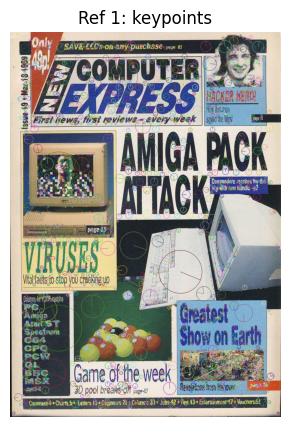

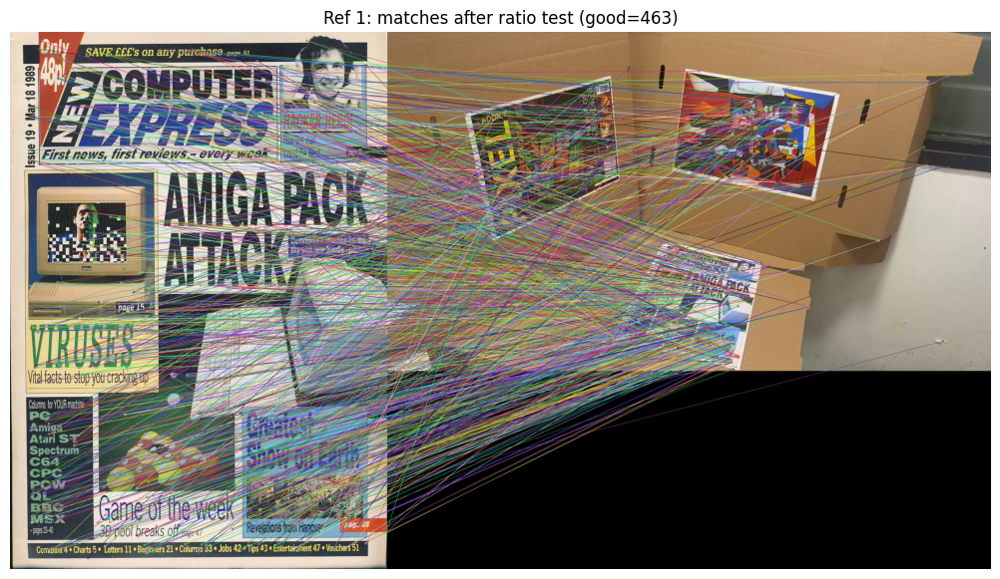

[Ref 2] kp_ref=3316  good_matches=300


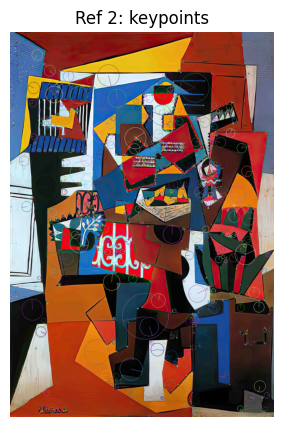

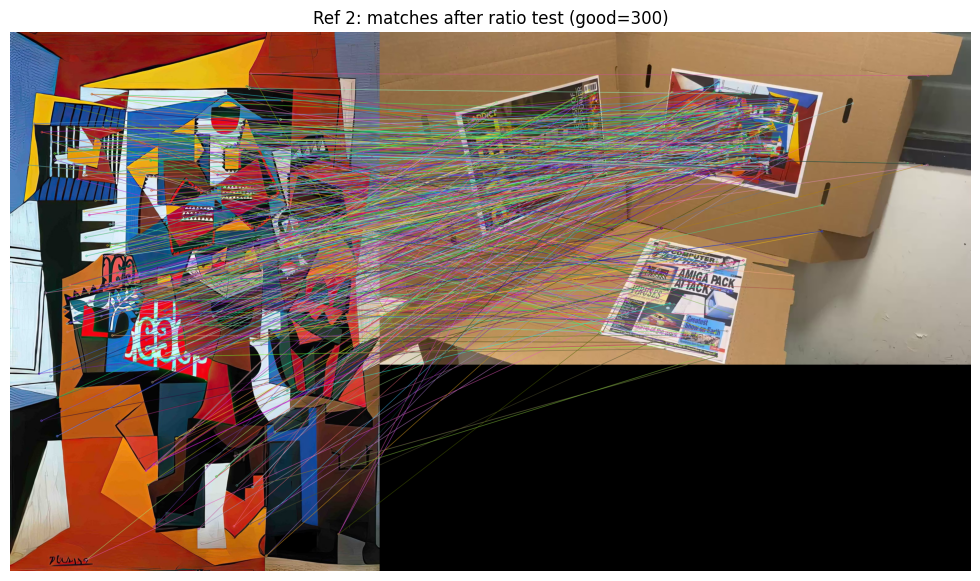

[Ref 3] kp_ref=5048  good_matches=396


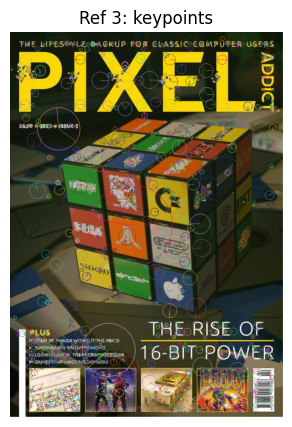

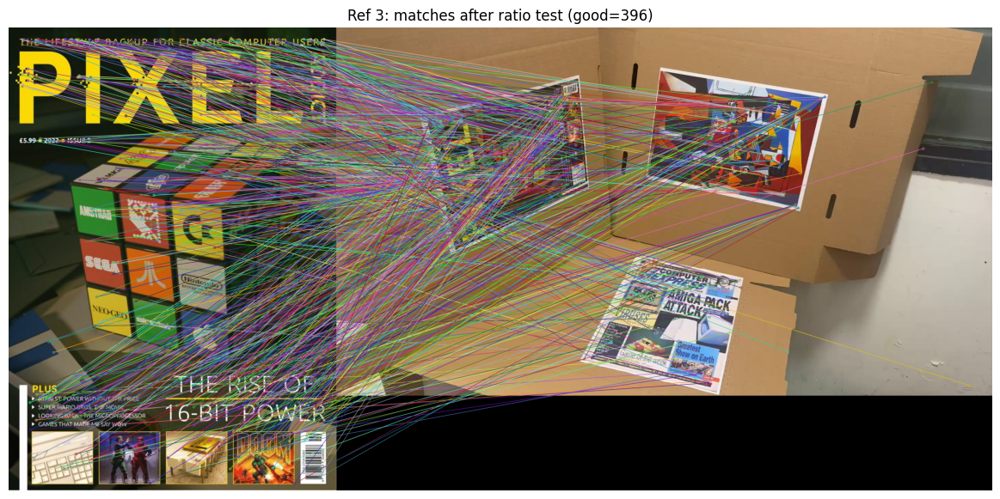

In [39]:
def ratio_test_pairs(matcher: cv2.BFMatcher, des_ref: np.ndarray, des_fr: np.ndarray, ratio: float):
    pairs = matcher.knnMatch(des_ref, des_fr, k=2)
    good = []
    good_pairs = []
    for p in pairs:
        if len(p) < 2:
            continue
        m, n = p[0], p[1]
        if m.distance < float(ratio) * n.distance:
            good.append(m)
            good_pairs.append([m, n])
    return good, good_pairs

# Build a detector + matcher consistent with cfg5 (like multiplane.py)
feat = str(cfg5.feature_type or "SIFT").strip().upper()
if feat == "SIFT":
    ref_detector = cv2.SIFT_create()
    matcher = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False)
elif feat == "ORB":
    ref_detector = cv2.ORB_create(nfeatures=1500)  # matches PlaneTracker default
    matcher = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=False)
else:
    raise ValueError(f"Unknown feature_type: {cfg5.feature_type}")

# Frame keypoints/descriptors are already computed in Step 2:
assert des_fr is not None and kp_fr is not None, "Frame features are missing; run Step 2 first"

# Save matching results for the next step (RANSAC homography)
ref_match_data = []

for i, ref_bgr in enumerate(refs, start=1):
    ref_gray = cv2.cvtColor(ref_bgr, cv2.COLOR_BGR2GRAY)
    kp_ref, des_ref = ref_detector.detectAndCompute(ref_gray, None)
    if des_ref is None or kp_ref is None:
        print(f"[Ref {i}] no descriptors")
        ref_match_data.append({"ref_idx": i, "kp_ref": None, "des_ref": None, "good": [], "good_pairs": [], "ref_bgr": ref_bgr})
        continue

    good, good_pairs = ratio_test_pairs(matcher, des_ref, des_fr, ratio=float(cfg5.ratio_test))
    ref_match_data.append({"ref_idx": i, "kp_ref": kp_ref, "des_ref": des_ref, "good": good, "good_pairs": good_pairs, "ref_bgr": ref_bgr})
    print(f"[Ref {i}] kp_ref={len(kp_ref)}  good_matches={len(good)}")

    # Keypoints (reference only)
    ref_kp_vis = cv2.drawKeypoints(ref_bgr, kp_ref, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    plt.figure(figsize=(7, 5))
    plt.imshow(cv2.cvtColor(ref_kp_vis, cv2.COLOR_BGR2RGB))
    plt.title(f"Ref {i}: keypoints")
    plt.axis("off")
    plt.show()

    # Matches after ratio test
    match_vis = cv2.drawMatchesKnn(
        ref_bgr,
        kp_ref,
        frame_bgr,
        kp_fr,
        good_pairs,
        None,
        flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS,
    )
    plt.figure(figsize=(16, 7))
    plt.imshow(cv2.cvtColor(match_vis, cv2.COLOR_BGR2RGB))
    plt.title(f"Ref {i}: matches after ratio test (good={len(good)})")
    plt.axis("off")
    plt.show()


### Step 3b — RANSAC Homography (inliers + projected quad)

After matching, we robustly estimate a homography with **RANSAC**.

For each reference image we show:
- number of **inlier matches** (RANSAC consensus set)
- inlier match visualization
- the projected reference **quad** drawn on the video frame


[Ref 1] inliers=229/463


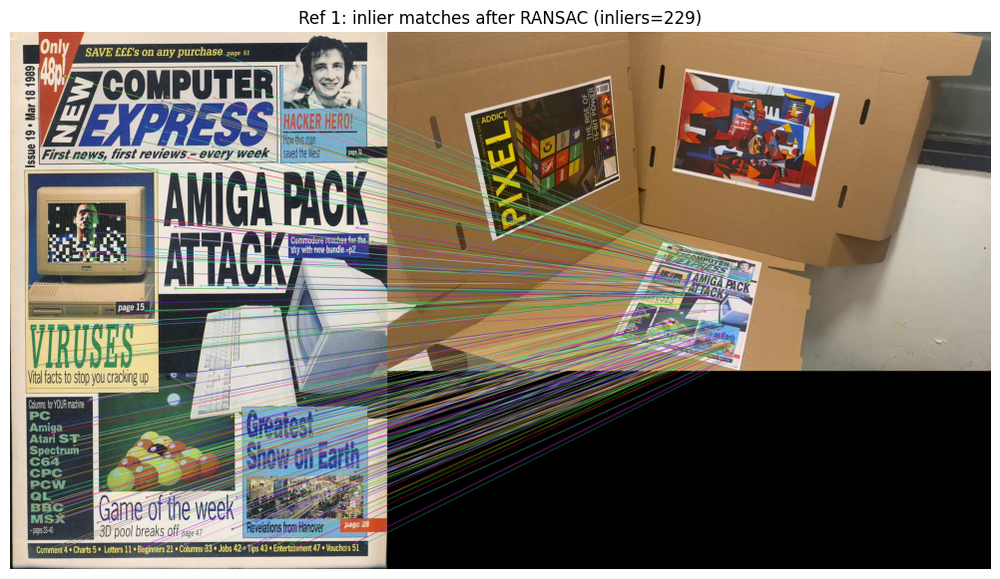

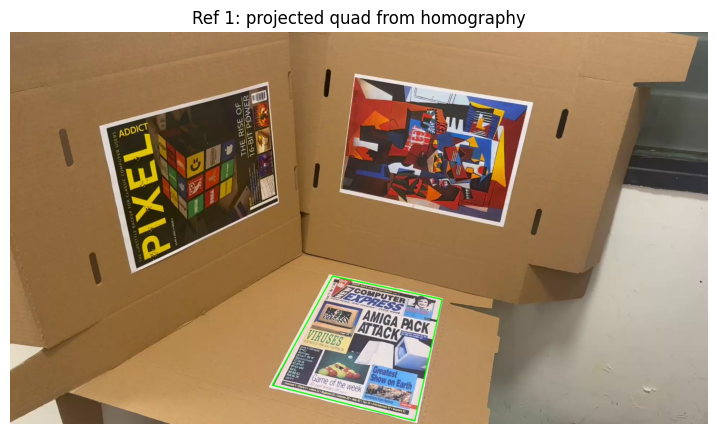

[Ref 2] inliers=215/300


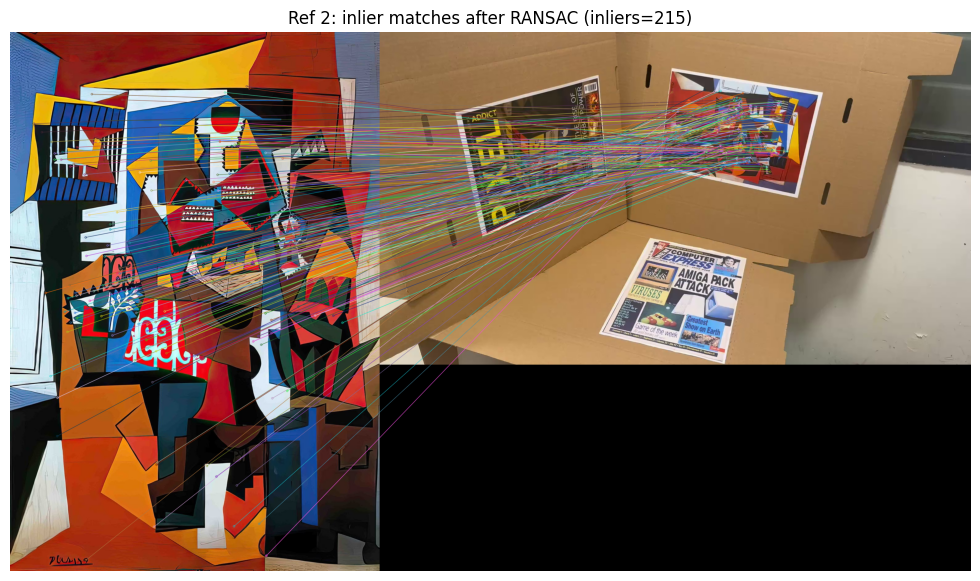

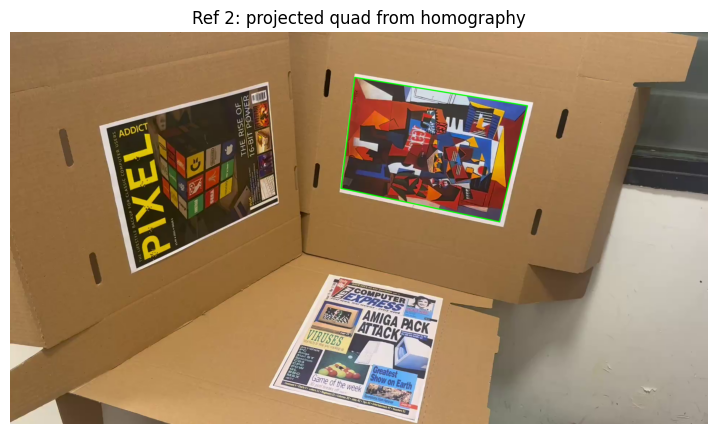

[Ref 3] inliers=176/396


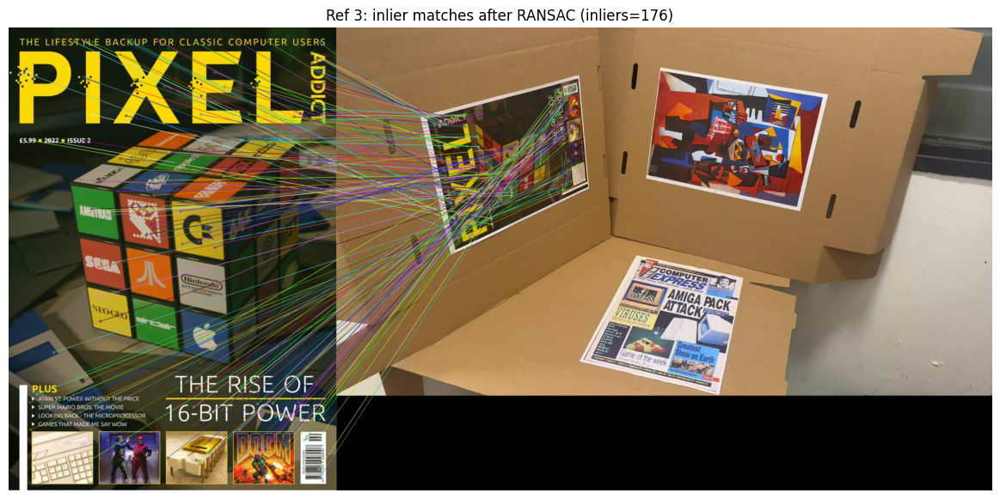

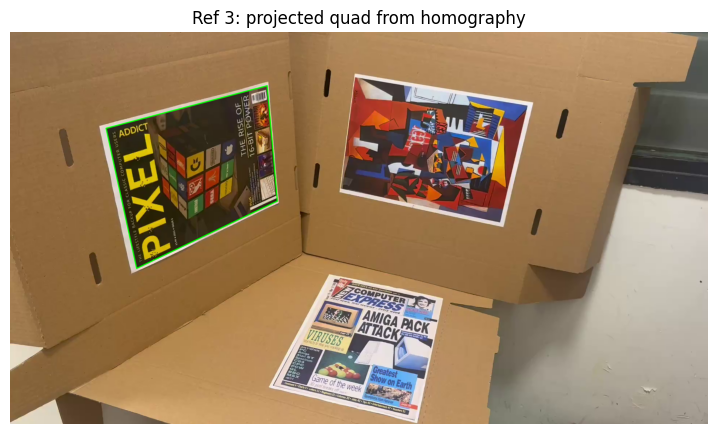

In [40]:
method = _get_homography_method(getattr(cfg5, "homography_method", "RANSAC"))
reproj = float(getattr(cfg5, "ransac_reproj_thresh", 3.5))
refine = bool(getattr(cfg5, "refine_homography_with_inliers", True))

for d in ref_match_data:
    i = int(d["ref_idx"])
    ref_bgr = d["ref_bgr"]
    kp_ref = d["kp_ref"]
    good = d["good"]

    if kp_ref is None or len(good) < 4:
        print(f"[Ref {i}] not enough matches for homography")
        continue

    src = np.float32([kp_ref[m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
    dst = np.float32([kp_fr[m.trainIdx].pt for m in good]).reshape(-1, 1, 2)

    H, inlier_mask = cv2.findHomography(src, dst, method, reproj)
    if H is None or inlier_mask is None:
        print(f"[Ref {i}] homography failed")
        continue

    inl = inlier_mask.ravel().astype(bool)
    inlier_matches = [m for m, keep in zip(good, inl) if keep]
    print(f"[Ref {i}] inliers={len(inlier_matches)}/{len(good)}")

    # Optional refinement: recompute least-squares H from inliers only (same idea as code)
    if refine and int(inl.sum()) >= 4:
        H2, _ = cv2.findHomography(src[inl], dst[inl], 0)
        if H2 is not None:
            H = H2

    # Inlier matches visualization
    inlier_vis = cv2.drawMatches(
        ref_bgr,
        kp_ref,
        frame_bgr,
        kp_fr,
        inlier_matches,
        None,
        flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS,
    )
    plt.figure(figsize=(16, 7))
    plt.imshow(cv2.cvtColor(inlier_vis, cv2.COLOR_BGR2RGB))
    plt.title(f"Ref {i}: inlier matches after RANSAC (inliers={len(inlier_matches)})")
    plt.axis("off")
    plt.show()

    # Project the reference corners as a quad onto the frame
    h, w = ref_bgr.shape[:2]
    ref_corners = np.float32([[0, 0], [w - 1, 0], [w - 1, h - 1], [0, h - 1]]).reshape(-1, 1, 2)
    quad = cv2.perspectiveTransform(ref_corners, H).reshape(-1, 2)

    quad_vis = frame_bgr.copy()
    cv2.polylines(quad_vis, [np.int32(quad).reshape(-1, 1, 2)], True, (0, 255, 0), 2, cv2.LINE_AA)

    plt.figure(figsize=(9, 6))
    plt.imshow(cv2.cvtColor(quad_vis, cv2.COLOR_BGR2RGB))
    plt.title(f"Ref {i}: projected quad from homography")
    plt.axis("off")
    plt.show()


### Step 4 — Estimate plane pose and draw the detected plane outline

Now that we saw the matches, we run the full per-plane update (`PlaneTracker.update_from_frame_features`) and visualize the detected plane outline (homography-based corners).


visible planes: 3 / 3


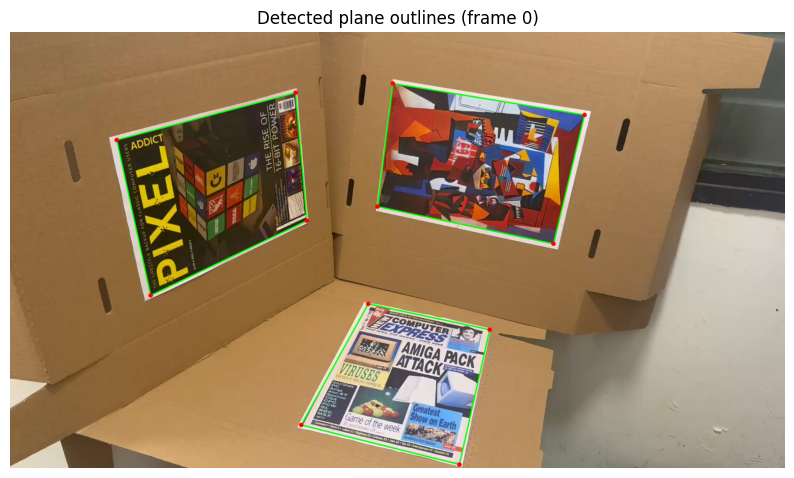

In [41]:
# Initialize per-plane trackers (one per reference)
planes = [
    PlaneTracker("P1", refs[0], cfg5),
    PlaneTracker("P2", refs[1], cfg5),
    PlaneTracker("P3", refs[2], cfg5),
]

out_outline = frame_bgr.copy()
visible = 0

for pl in planes:
    pose = pl.update_from_frame_features(kp_fr, des_fr, K, dist)
    if not pose.visible:
        continue
    visible += 1

    outline2d = pl.last_corners_img()
    if outline2d is None:
        outline2d = pl.project_plane_outline(pose.rvec, pose.tvec, K, dist)

    out_outline = _draw_plane_outline_corners_stripes(
        out_outline,
        outline2d,
        outline_color_bgr=getattr(cfg5, "outline_color_bgr", (0, 255, 0)),
        outline_thickness=int(getattr(cfg5, "outline_thickness", 2)),
        corner_color_bgr=getattr(cfg5, "corner_color_bgr", (0, 0, 255)),
        corner_radius=int(getattr(cfg5, "corner_radius", 5)),
        stripes_color_bgr=getattr(cfg5, "stripes_color_bgr", (255, 255, 255)),
        stripes_thickness=int(getattr(cfg5, "stripes_thickness", 1)),
        stripes_count=int(getattr(cfg5, "stripes_count", 0)),
    )

print("visible planes:", visible, "/ 3")

plt.figure(figsize=(10, 7))
plt.imshow(cv2.cvtColor(out_outline, cv2.COLOR_BGR2RGB))
plt.title(f"Detected plane outlines (frame {frame_idx})")
plt.axis("off")
plt.show()


### Step 5 — Draw portals (single frame)

Now we overlay the portals on top of the detected planes.

---

### Optional — Export a full Part 5 video

This calls the real pipeline in `multiplane.py` and writes an output video to `outputs/videos/`.

Uncomment and run one of the cells below if you want an exported video (it can take time).


visible planes: 3 / 3
env textures loaded: [True, True, True]


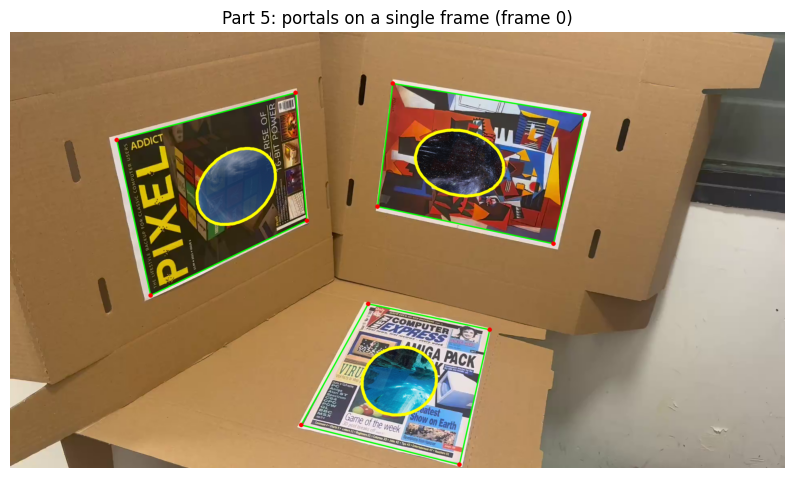

In [42]:
# Draw portals on a single frame
# If you want to see "what's inside" the portal, enable the env-texture mode below.

# Toggle: texture portal (portal360-style) vs solid color fill
use_env_texture = True  # set False to use a solid color portal

portal_shape = str(getattr(cfg5, "portal_shape", "rect") or "rect").strip().lower()
if portal_shape not in ("rect", "ellipse"):
    portal_shape = "rect"

# Load per-plane environment panoramas (optional)
env_paths = [ROOT / cfg5.env1_360_path, ROOT / cfg5.env2_360_path, ROOT / cfg5.env3_360_path]
envs = []
for p in env_paths:
    envs.append(imread_any(p) if p.exists() else None)

out_portal = frame_bgr.copy()
visible = 0

for i, pl in enumerate(planes):
    pose = pl.update_from_frame_features(kp_fr, des_fr, K, dist)
    if not pose.visible:
        continue
    visible += 1

    portal2d = pl.project_portal(pose.rvec, pose.tvec, K, dist)

    # If env texture is available, render a portal texture from the equirect panorama
    pano = envs[i] if (i < len(envs)) else None
    if bool(use_env_texture) and pano is not None:
        C_obj = _camera_center_in_object(pose.rvec, pose.tvec)

        # Match export_part5_video() FOV logic
        fov = float(getattr(cfg5, "portal_env_fov_scale", 1.0))
        if bool(getattr(cfg5, "portal_env_fov_adaptive", False)):
            ref_d = float(getattr(cfg5, "portal_env_fov_ref_distance", 1.0))
            if ref_d <= 1e-6:
                ref_d = 1.0
            d = float(abs(C_obj[2]))
            fov *= max(1.0, d / ref_d)

        tex = _render_portal_from_equirect_sphere(
            pano,
            C_obj,
            portal_w=pl.portal_w * fov,
            portal_h=pl.portal_h * fov,
            out_size=int(getattr(cfg5, "portal_tex_size", 384)),
            sphere_radius=float(getattr(cfg5, "portal_env_sphere_radius", 20.0)),
        )

        # Warp the texture into the portal region
        if portal_shape == "ellipse":
            ell2d = pl.project_portal_ellipse(pose.rvec, pose.tvec, K, dist)
            if ell2d.shape[0] >= 12 and np.isfinite(ell2d).all():
                mask = np.zeros(out_portal.shape[:2], dtype=np.uint8)
                cv2.fillPoly(mask, [np.int32(ell2d).reshape(-1, 1, 2)], 255, lineType=cv2.LINE_AA)
                out_portal = _warp_texture_onto_quad_with_frame_mask(out_portal, tex, portal2d, mask, alpha=float(getattr(cfg5, "portal_alpha", 0.9)))
                cv2.polylines(out_portal, [np.int32(ell2d).reshape(-1, 1, 2)], True, tuple(getattr(cfg5, "portal_border_bgr", (0, 255, 255))), int(getattr(cfg5, "portal_border_thickness", 6)), cv2.LINE_AA)
            else:
                # fallback to rect border if ellipse projection fails
                out_portal = _warp_texture_onto_quad(out_portal, tex, portal2d, alpha=float(getattr(cfg5, "portal_alpha", 0.9)))
                cv2.polylines(out_portal, [np.int32(portal2d).reshape(-1, 1, 2)], True, tuple(getattr(cfg5, "portal_border_bgr", (0, 255, 255))), int(getattr(cfg5, "portal_border_thickness", 6)), cv2.LINE_AA)
        else:
            out_portal = _warp_texture_onto_quad(out_portal, tex, portal2d, alpha=float(getattr(cfg5, "portal_alpha", 0.9)))
            cv2.polylines(out_portal, [np.int32(portal2d).reshape(-1, 1, 2)], True, tuple(getattr(cfg5, "portal_border_bgr", (0, 255, 255))), int(getattr(cfg5, "portal_border_thickness", 6)), cv2.LINE_AA)

    else:
        # Solid fill fallback (what you saw before)
        if portal_shape == "ellipse":
            ell2d = pl.project_portal_ellipse(pose.rvec, pose.tvec, K, dist)
            if ell2d.shape[0] >= 12 and np.isfinite(ell2d).all():
                mask = np.zeros(out_portal.shape[:2], dtype=np.uint8)
                cv2.fillPoly(mask, [np.int32(ell2d).reshape(-1, 1, 2)], 255, lineType=cv2.LINE_AA)

                a = float(getattr(cfg5, "portal_alpha", 0.9))
                if a > 0:
                    idx = mask > 0
                    col = np.array(getattr(cfg5, "portal_fill_bgr", (40, 40, 200)), dtype=np.float32).reshape(1, 1, 3)
                    out_f = out_portal.astype(np.float32)
                    out_f[idx] = a * col + (1.0 - a) * out_f[idx]
                    out_portal = out_f.astype(np.uint8)

                cv2.polylines(out_portal, [np.int32(ell2d).reshape(-1, 1, 2)], True, tuple(getattr(cfg5, "portal_border_bgr", (0, 255, 255))), int(getattr(cfg5, "portal_border_thickness", 6)), cv2.LINE_AA)
        else:
            out_portal = _alpha_fill_convex_poly(out_portal, portal2d, tuple(getattr(cfg5, "portal_fill_bgr", (40, 40, 200))), alpha=float(getattr(cfg5, "portal_alpha", 0.9)))
            cv2.polylines(out_portal, [np.int32(portal2d).reshape(-1, 1, 2)], True, tuple(getattr(cfg5, "portal_border_bgr", (0, 255, 255))), int(getattr(cfg5, "portal_border_thickness", 6)), cv2.LINE_AA)

    # Outline (debug-friendly)
    outline2d = pl.last_corners_img()
    if outline2d is None:
        outline2d = pl.project_plane_outline(pose.rvec, pose.tvec, K, dist)
    out_portal = _draw_plane_outline_corners_stripes(
        out_portal,
        outline2d,
        outline_color_bgr=getattr(cfg5, "outline_color_bgr", (0, 255, 0)),
        outline_thickness=int(getattr(cfg5, "outline_thickness", 2)),
        corner_color_bgr=getattr(cfg5, "corner_color_bgr", (0, 0, 255)),
        corner_radius=int(getattr(cfg5, "corner_radius", 5)),
        stripes_color_bgr=getattr(cfg5, "stripes_color_bgr", (255, 255, 255)),
        stripes_thickness=int(getattr(cfg5, "stripes_thickness", 1)),
        stripes_count=int(getattr(cfg5, "stripes_count", 0)),
    )

print("visible planes:", visible, "/ 3")
print("env textures loaded:", [e is not None for e in envs])

plt.figure(figsize=(10, 7))
plt.imshow(cv2.cvtColor(out_portal, cv2.COLOR_BGR2RGB))
plt.title(f"Part 5: portals on a single frame (frame {frame_idx})")
plt.axis("off")
plt.show()

# ---
# Optional video export (uncomment to run)
# from multiplane import export_part5_video
#
# # Portal (solid color)
# export_part5_video(cfg5, "outputs/videos/part5_portal.ipynb_export.mp4", draw_portal=True, use_env_portals=False, draw_plane_outline=True, draw_debug_text=False)
#
# # Portal360 (requires env images in cfg5.env*_360_path)
# export_part5_video(cfg5, "outputs/videos/part5_portal360.ipynb_export.mp4", draw_portal=True, use_env_portals=True, draw_plane_outline=True, draw_debug_text=False)
#
# # Outline-only
# export_part5_video(cfg5, "outputs/videos/part5_outline.ipynb_export.mp4", draw_portal=False, use_env_portals=False, draw_plane_outline=True, draw_debug_text=False)

